# Using scanpy with python for Single Cell RNA Sequencing Analysis

Reference: https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.a

## Get the data

In [50]:
!mkdir data
!wget http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz -O data/pbmc3k_filtered_gene_bc_matrices.tar.gz
!cd data; tar -xzf pbmc3k_filtered_gene_bc_matrices.tar.gz

mkdir: cannot create directory ‘data’: File exists
--2019-12-04 16:38:16--  http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 13.224.51.8, 13.224.51.48, 13.224.51.91, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|13.224.51.8|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7621991 (7.3M) [application/x-tar]
Saving to: ‘data/pbmc3k_filtered_gene_bc_matrices.tar.gz’

data/pbmc3k_filtere 100%[===================>]   7.27M  23.8MB/s    in 0.3s    

2019-12-04 16:38:17 (23.8 MB/s) - ‘data/pbmc3k_filtered_gene_bc_matrices.tar.gz’ saved [7621991/7621991]



## Importing the python packages

In [51]:
import numpy as np
import pandas as pd
import scanpy as sc

In [52]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = './write/pbmc3k.h5ad'  # the file that will store the analysis results


scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.16.4 scipy==1.3.0 pandas==0.24.2 scikit-learn==0.21.2 statsmodels==0.10.0 python-igraph==0.7.1 louvain==0.6.1


In [53]:
sc.settings.set_figure_params(dpi=200)

In [54]:
adata = sc.read_10x_mtx(
    './data/filtered_gene_bc_matrices/hg19/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                  # use gene symbols for the variable names (variables-axis index)
    cache=True)   

... reading from cache file cache/data-filtered_gene_bc_matrices-hg19-matrix.h5ad


In [55]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'

In [56]:
adata.n_obs

2700

In [57]:
adata.X

<2700x32738 sparse matrix of type '<class 'numpy.float32'>'
	with 2286884 stored elements in Compressed Sparse Row format>

In [58]:
adata.n_vars

32738

In [59]:
adata.obs # this comes from barcodes.tsv

""
0
AAACATACAACCAC-1
AAACATTGAGCTAC-1
AAACATTGATCAGC-1
AAACCGTGCTTCCG-1
AAACCGTGTATGCG-1
AAACGCACTGGTAC-1
AAACGCTGACCAGT-1
AAACGCTGGTTCTT-1
AAACGCTGTAGCCA-1


In [60]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'>

In [61]:
adata.obs_names # this comes from barcodes.tsv

Index(['AAACATACAACCAC-1', 'AAACATTGAGCTAC-1', 'AAACATTGATCAGC-1',
       'AAACCGTGCTTCCG-1', 'AAACCGTGTATGCG-1', 'AAACGCACTGGTAC-1',
       'AAACGCTGACCAGT-1', 'AAACGCTGGTTCTT-1', 'AAACGCTGTAGCCA-1',
       'AAACGCTGTTTCTG-1',
       ...
       'TTTCAGTGTCACGA-1', 'TTTCAGTGTCTATC-1', 'TTTCAGTGTGCAGT-1',
       'TTTCCAGAGGTGAG-1', 'TTTCGAACACCTGA-1', 'TTTCGAACTCTCAT-1',
       'TTTCTACTGAGGCA-1', 'TTTCTACTTCCTCG-1', 'TTTGCATGAGAGGC-1',
       'TTTGCATGCCTCAC-1'],
      dtype='object', name=0, length=2700)

In [62]:
adata.obs_names_make_unique

<bound method AnnData.obs_names_make_unique of AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'>

In [63]:
adata.obs_vector

<bound method AnnData.obs_vector of AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'>

In [64]:
adata.obsm

AxisArrays with keys: 

In [65]:
adata.obsm_keys

<bound method AnnData.obsm_keys of AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'>

In [66]:
adata.raw

In [67]:
adata.shape

(2700, 32738)

In [68]:
adata.smp_keys

<bound method AnnData.smp_keys of AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'>

In [69]:
adata.T

AnnData object with n_obs × n_vars = 32738 × 2700 
    obs: 'gene_ids'

In [70]:
adata.uns

OrderedDict()

In [71]:
adata.var # this comes from genes.tsv

,gene_ids
MIR1302-10,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
RP11-34P13.7,ENSG00000238009
RP11-34P13.8,ENSG00000239945
AL627309.1,ENSG00000237683
RP11-34P13.14,ENSG00000239906
RP11-34P13.9,ENSG00000241599
AP006222.2,ENSG00000228463
RP4-669L17.10,ENSG00000237094


In [72]:
adata.var_names

Index(['MIR1302-10', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'AL627309.1', 'RP11-34P13.14', 'RP11-34P13.9', 'AP006222.2',
       'RP4-669L17.10',
       ...
       'KIR3DL2-1', 'AL590523.1', 'CT476828.1', 'PNRC2-1', 'SRSF10-1',
       'AC145205.1', 'BAGE5', 'CU459201.1', 'AC002321.2', 'AC002321.1'],
      dtype='object', length=32738)

In [73]:
adata.varm

AxisArrays with keys: 

In [74]:
adata.X

<2700x32738 sparse matrix of type '<class 'numpy.float32'>'
	with 2286884 stored elements in Compressed Sparse Row format>

In [75]:
adata.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

In [76]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738 
    var: 'gene_ids'

## Preprocessing
Show those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


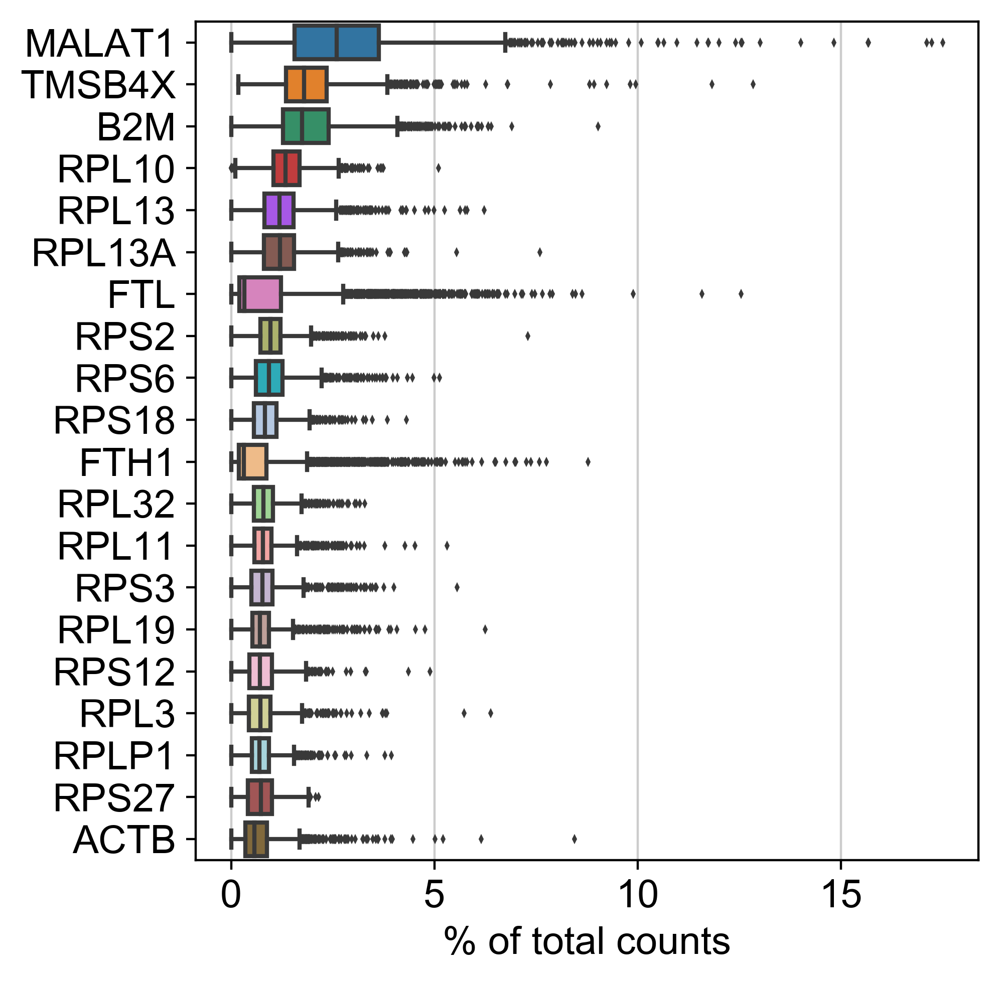

In [77]:
sc.pl.highest_expr_genes(adata, n_top=20)

## Basic filtering.

In [81]:
sc.pp.filter_cells(adata, min_genes=200)

In [79]:
sc.pp.filter_genes(adata, min_cells=3)

filtered out 19024 genes that are detectedin less than 3 cells


### Let us assemble some information about mitochondrial genes, which are important for quality control.
Citing from “Simple Single Cell” workflows (Lun, McCarthy & Marioni, 2017):

High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

In [82]:

mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

### A violin plot of the computed quality measures.

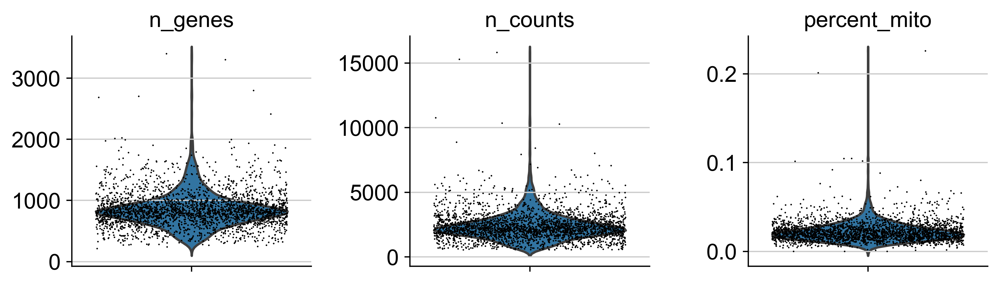

In [84]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

### Remove cells that have too many mitochondrial genes expressed or too many total counts.

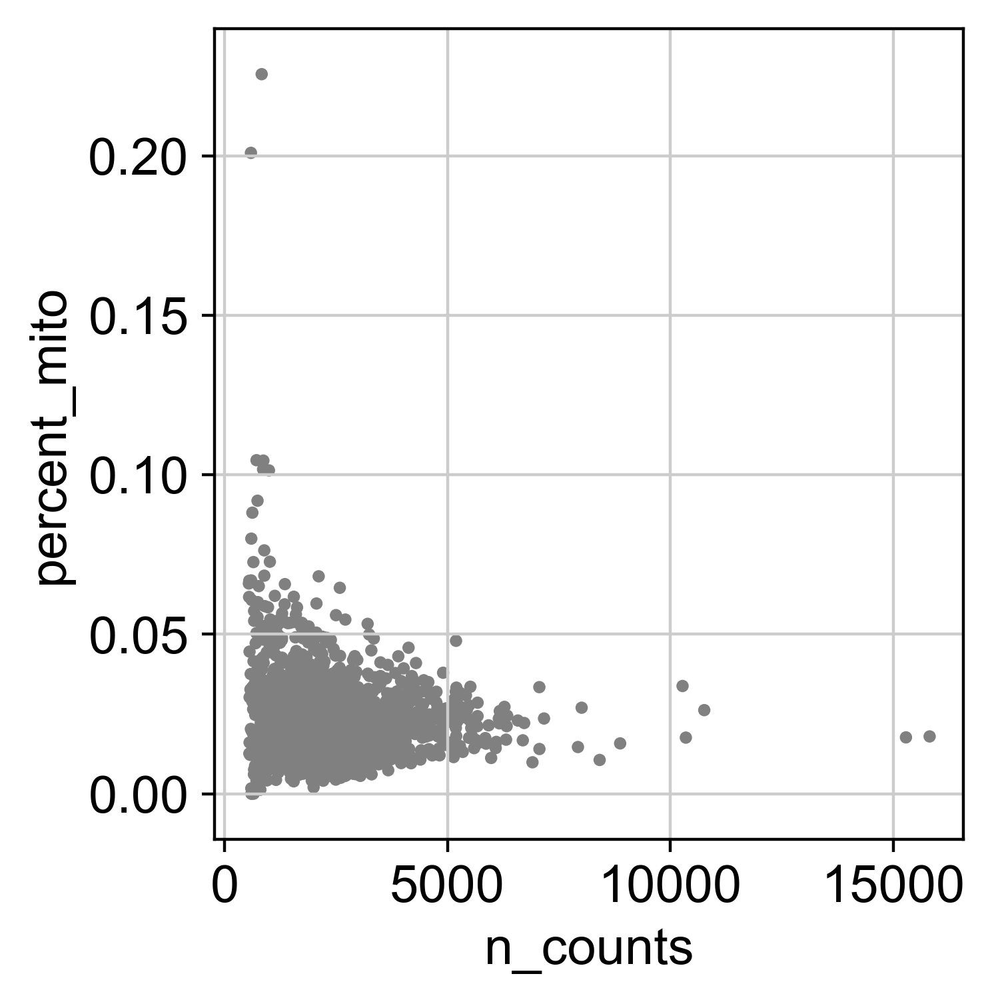

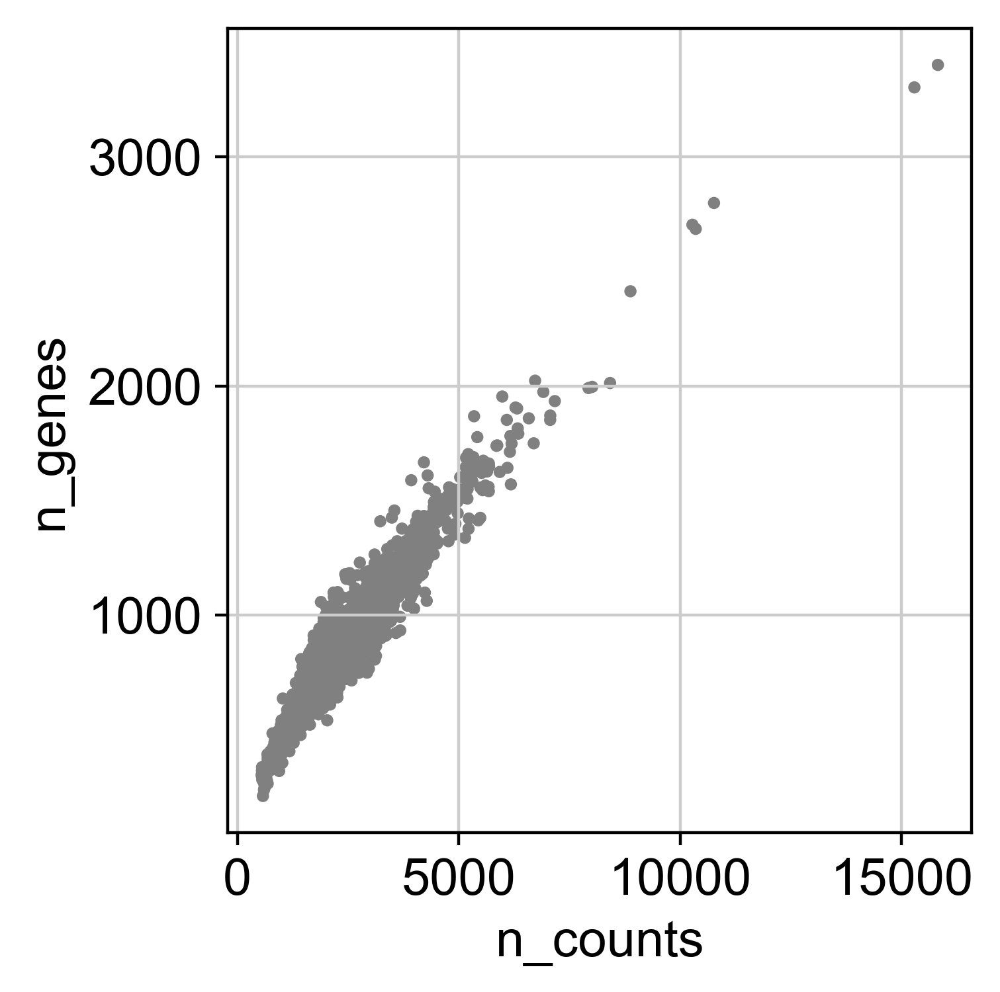

In [85]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [86]:
adata

AnnData object with n_obs × n_vars = 2700 × 13714 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells'

### Do the filtering.

In [87]:
adata = adata[adata.obs['n_genes'] < 2500, :]
adata = adata[adata.obs['percent_mito'] < 0.05, :]

In [88]:
adata

View of AnnData object with n_obs × n_vars = 2638 × 13714 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells'

Total-count normalize (library-size correct) the data matrix X to 10,000 reads per cell, so that counts become comparable among cells.

In [90]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


### Logarithmize the data

In [91]:
sc.pp.log1p(adata)

In [92]:
adata

AnnData object with n_obs × n_vars = 2638 × 13714 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells'

#### Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the “relevant data” for visualization and differential testing, some would prefer to store the unnormalized data.

In [93]:
adata.raw = adata

### Identify highly variable gene

In [94]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


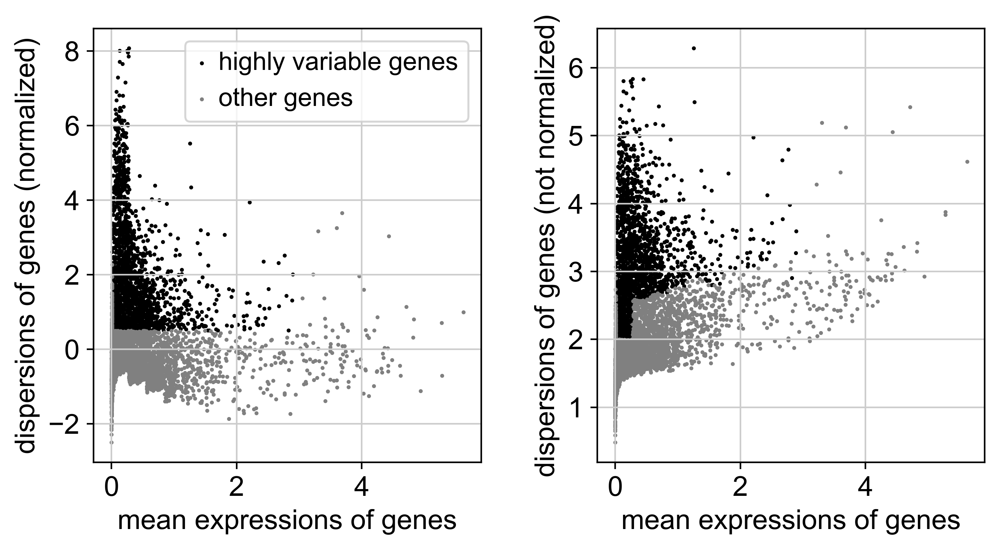

In [95]:
sc.pl.highly_variable_genes(adata)

#### Do the filtering

In [96]:
adata = adata[:, adata.var['highly_variable']]

In [97]:
adata

View of AnnData object with n_obs × n_vars = 2638 × 1838 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

#### Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [98]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:12)


#### Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [99]:
sc.pp.scale(adata, max_value=10)

## Principal Component Analysis

### Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [101]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:04)


#### We can make a scatter plot in the PCA coordinates, but we will not use that later on.



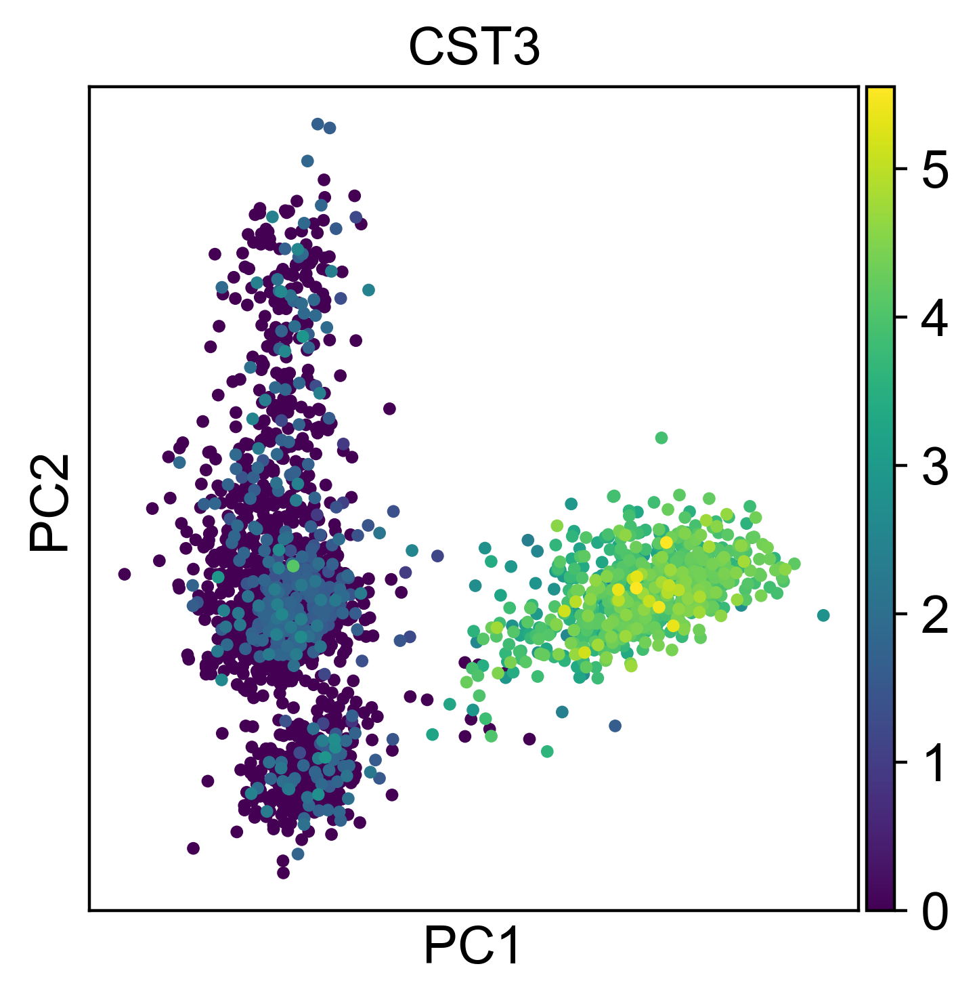

In [103]:
sc.pl.pca(adata, color='CST3')

#### Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often, a rough estimate of the number of PCs does fine.

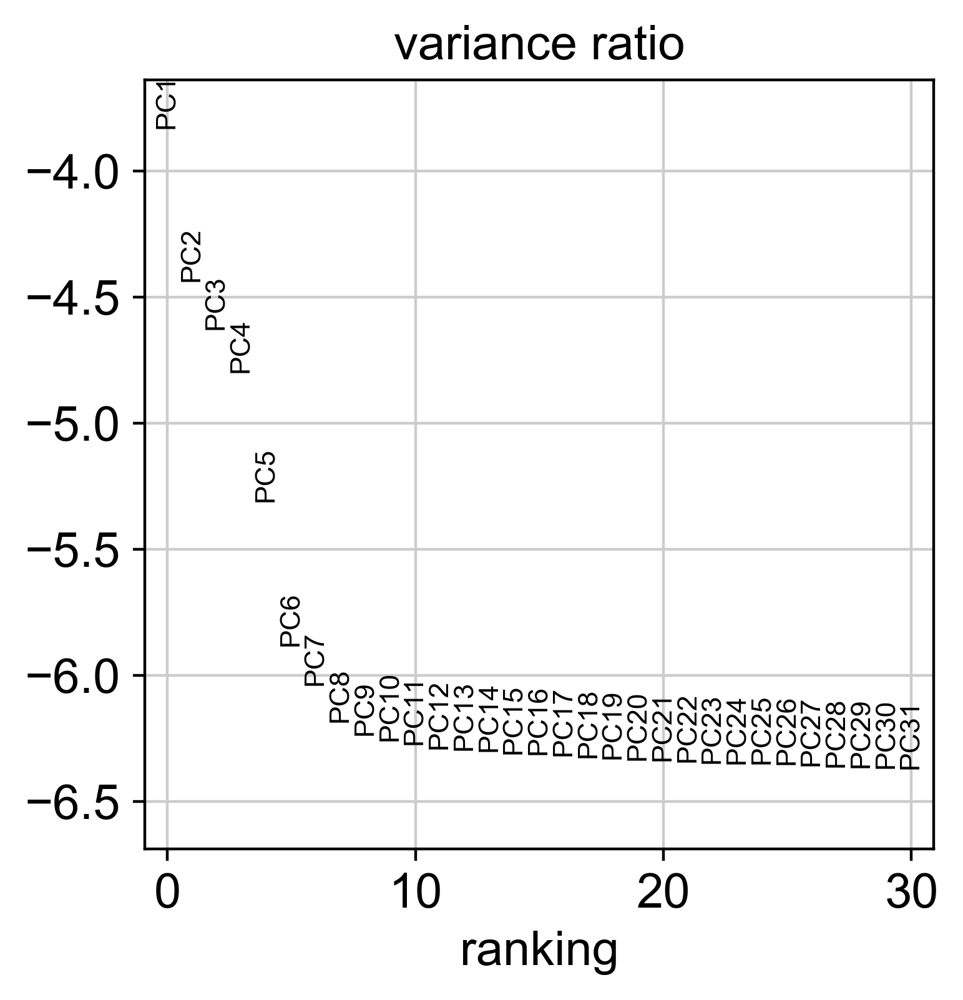

In [104]:
sc.pl.pca_variance_ratio(adata, log=True)

In [105]:
adata.write(results_file)

In [106]:
adata

AnnData object with n_obs × n_vars = 2638 × 1838 
    obs: 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

#### Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.

In [107]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)


## Embedding the neighborhood graph


## We advertise embedding the graph in 2 dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preservers trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

In [110]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


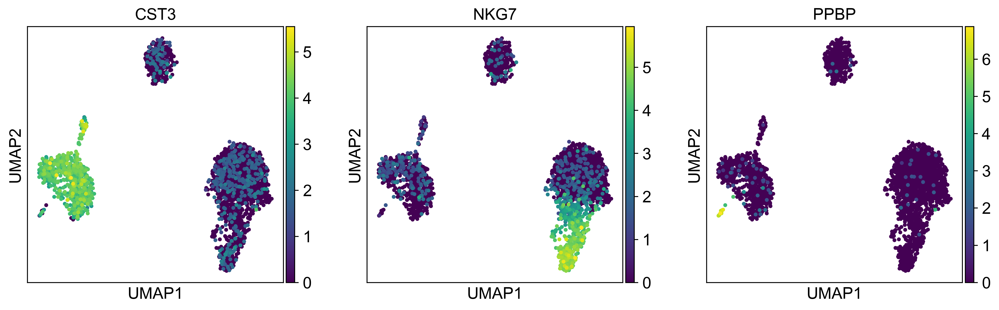

In [111]:
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'])

#### As we set the `.raw` attribute of adata, the previous plots showed the “raw” (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don’t want to use `.raw`.

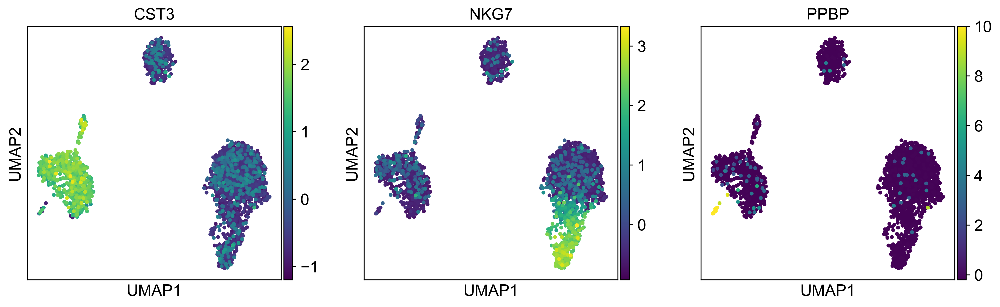

In [112]:
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)


## Clustering the neighborhood graph

#### As Seurat and many others, we recommend the Louvain graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by Levine et al. (2015). Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [113]:
sc.tl.louvain(adata)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


#### Plot the clusters, which agree quite well with the result of Seurat.

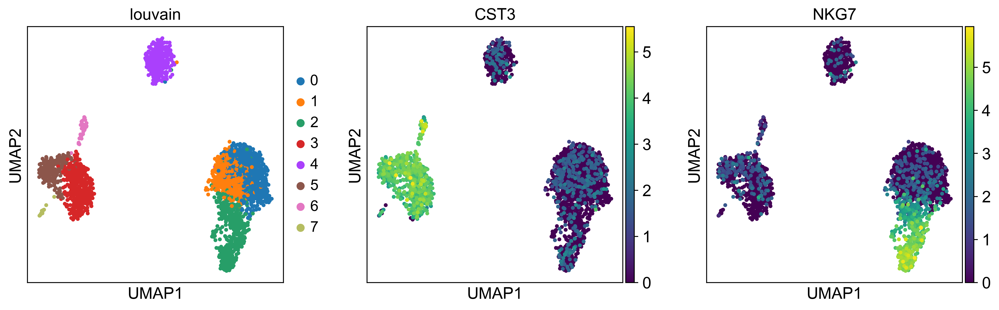

In [114]:
sc.pl.umap(adata, color=['louvain', 'CST3', 'NKG7'])

In [115]:
adata.write(results_file)

## Finding marker genes

#### Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


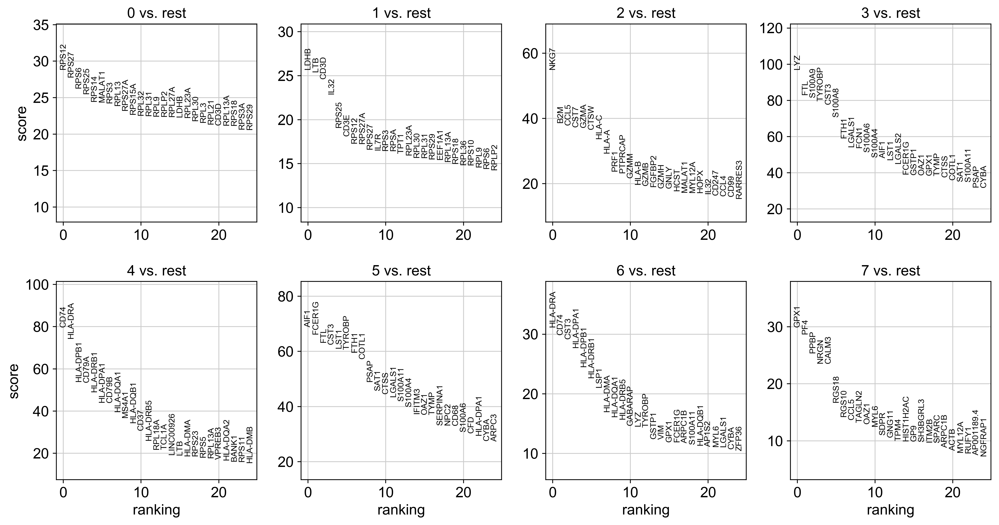

In [116]:

sc.tl.rank_genes_groups(adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

#### The result of a Wilcoxon rank-sum (Mann-Whitney-U) test is very similar. We recommend using the latter in publications, see e.g., Sonison & Robinson (2018). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


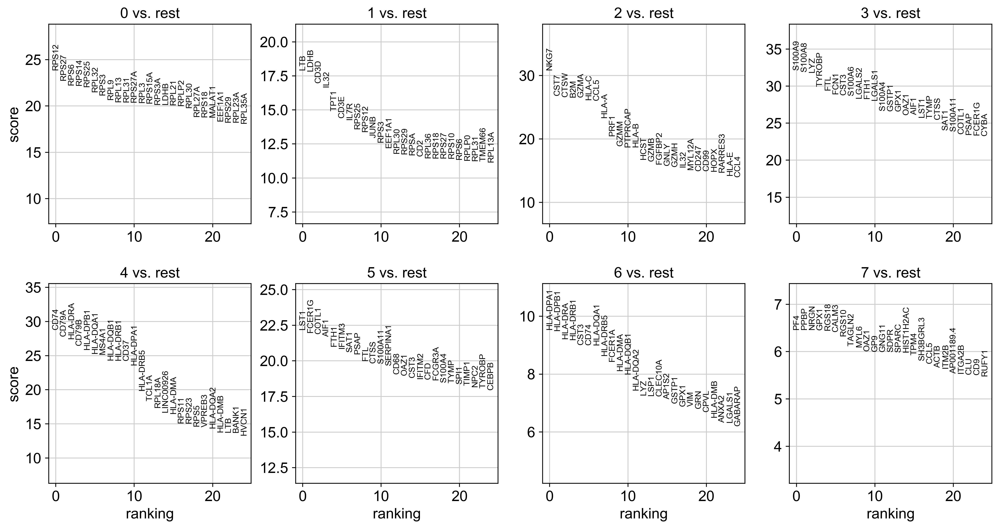

In [117]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [118]:
adata.write(results_file)

#### As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by Natranos et al. (2018). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. Clark et al. (2014) has more details.

ranking genes


/home/ivory/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/ivory/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:04)


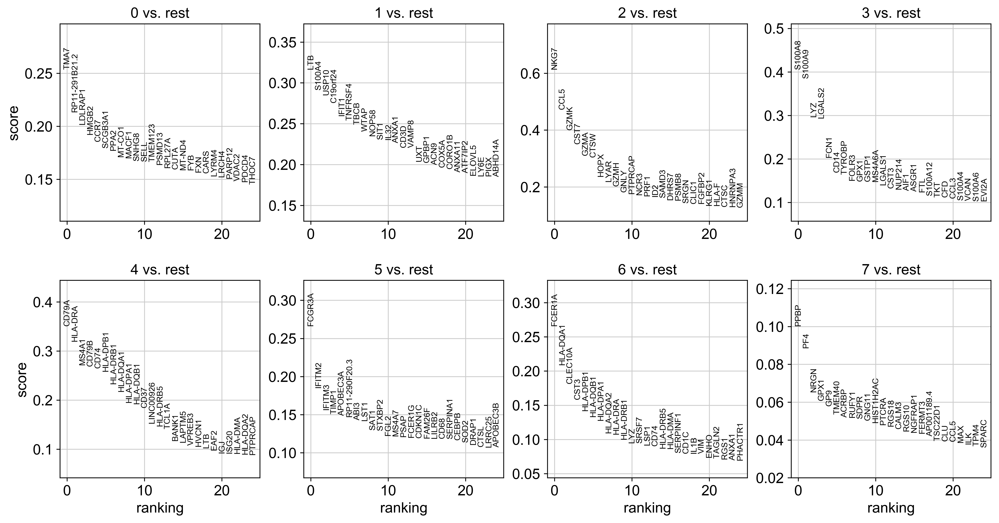

In [119]:
sc.tl.rank_genes_groups(adata, 'louvain', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

#### With the exceptions of IL7R, which is only found by the t-test and FCER1A, which is only found by the other two appraoches, all marker genes are recovered in all approaches.

#### Lets define Marker genes for later references

In [120]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP']

#### Reload the object that has been save with the Wilcoxon Rank-Sum test result.

In [121]:
adata = sc.read(results_file)

### Show the 10 top ranked genes per cluster 0, 1, …, 7 in a dataframe.

In [122]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7
0,RPS12,LTB,NKG7,S100A9,CD74,LST1,HLA-DPA1,PF4
1,RPS27,LDHB,CST7,S100A8,CD79A,FCER1G,HLA-DPB1,PPBP
2,RPS6,CD3D,CTSW,LYZ,HLA-DRA,COTL1,HLA-DRA,NRGN
3,RPS14,IL32,B2M,TYROBP,CD79B,AIF1,HLA-DRB1,GPX1
4,RPS25,TPT1,GZMA,FTL,HLA-DPB1,FTH1,CST3,RGS18


#### Get a table with the scores and groups.

In [123]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p
0,RPS12,9.026560e-126,LTB,8.162182e-72,NKG7,6.187607e-209,S100A9,1.009749e-226,CD74,2.723938e-182,LST1,4.931596e-109,HLA-DPA1,1.529847e-21,PF4,1.031259e-10
1,RPS27,1.772966e-114,LDHB,3.115084e-71,CST7,1.104469e-158,S100A8,1.649295e-223,CD79A,2.536548e-170,FCER1G,5.433477e-107,HLA-DPB1,2.242690e-21,PPBP,1.033660e-10
2,RPS6,1.556704e-109,CD3D,1.258019e-64,CTSW,3.941318e-156,LYZ,3.700604e-222,HLA-DRA,7.832712e-166,COTL1,2.739069e-106,HLA-DRA,3.212898e-20,NRGN,1.040897e-10
3,RPS14,3.608309e-109,IL32,2.172221e-62,B2M,1.572937e-155,TYROBP,5.428042e-197,CD79B,2.327452e-154,AIF1,2.617073e-104,HLA-DRB1,4.290175e-20,GPX1,1.098044e-10
4,RPS25,8.213676e-108,TPT1,2.180192e-50,GZMA,2.087471e-155,FTL,2.981503e-190,HLA-DPB1,1.511333e-147,FTH1,5.826436e-98,CST3,2.030298e-19,RGS18,1.150221e-10


#### Compare to a single cluster.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


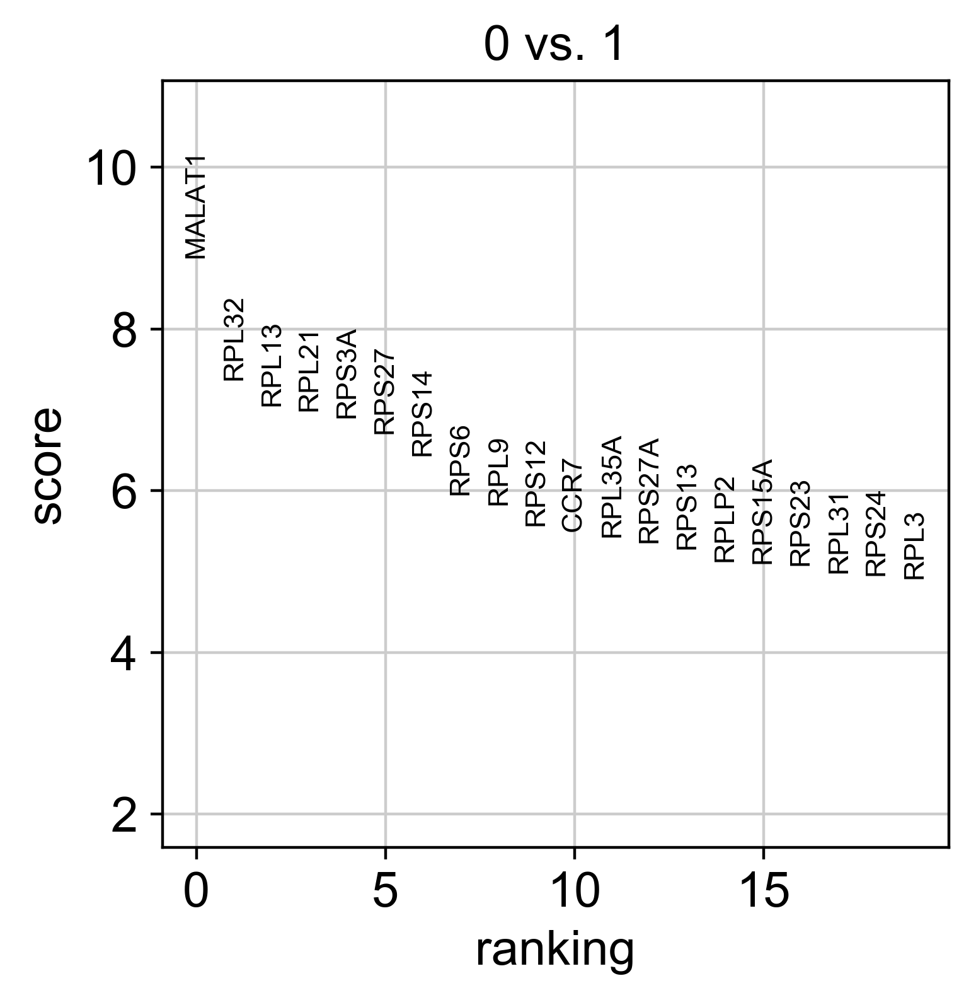

In [124]:
sc.tl.rank_genes_groups(adata, 'louvain', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

#### If we want a more detailed view for a certain group, use sc.pl.rank_genes_groups_violin.

/home/ivory/anaconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


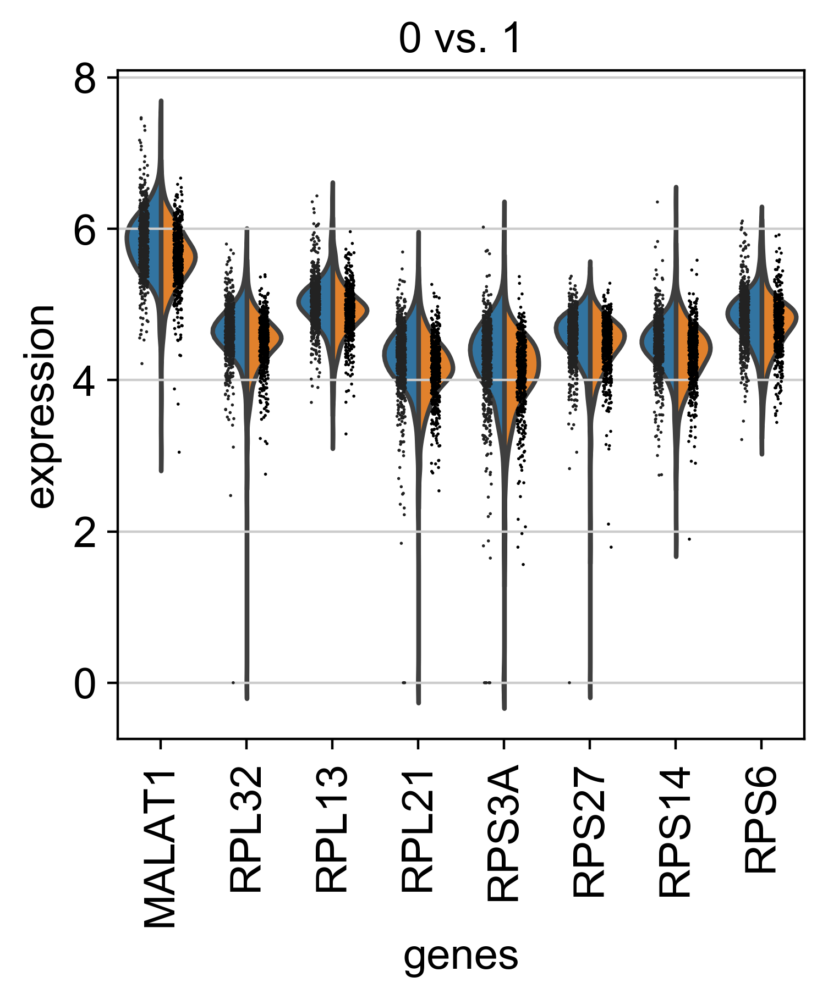

In [125]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

#### Reload the object that computed differential expression by comparing to the rest of the groups.

In [126]:
adata = sc.read(results_file)

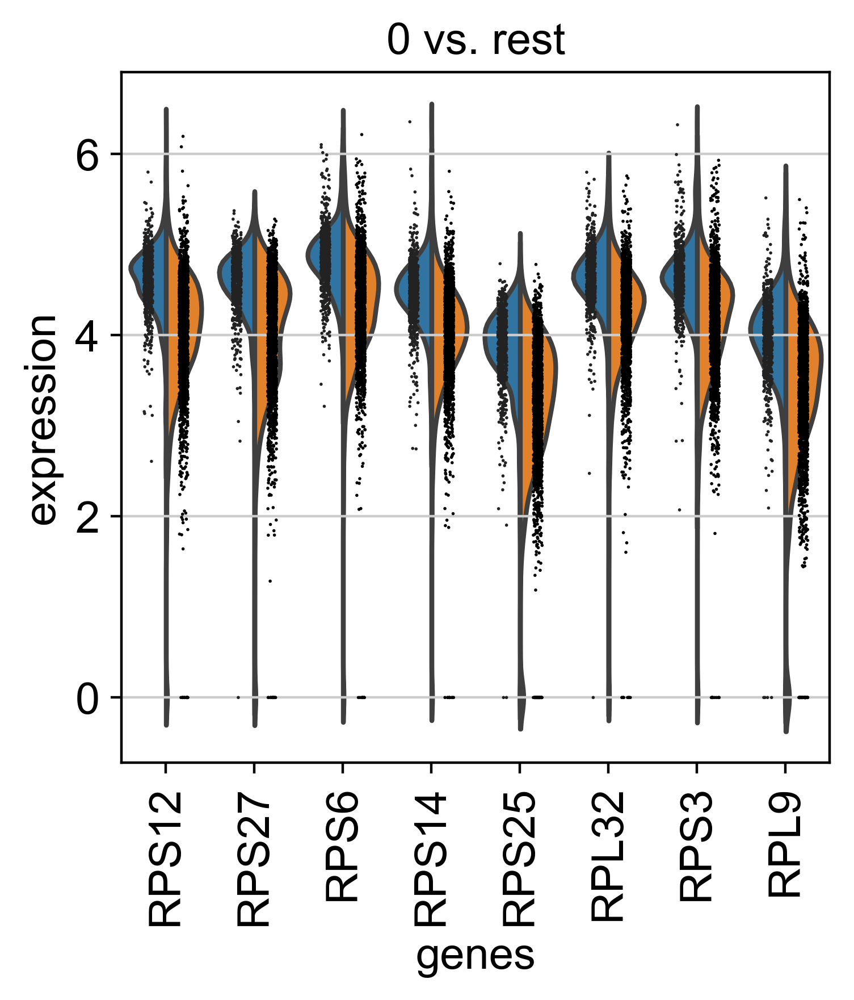

In [127]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

#### If you want to compare a certain gene across groups, use the following.

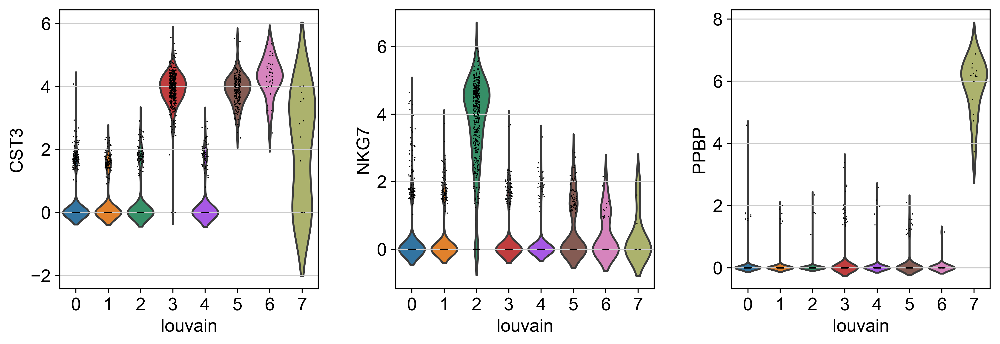

In [128]:
sc.pl.violin(adata, ['CST3', 'NKG7', 'PPBP'], groupby='louvain')

#### Mark the cell types.

In [129]:
new_cluster_names = [
    'CD4 T', 'CD14+ Monocytes',
    'B', 'CD8 T',
    'NK', 'FCGR3A+ Monocytes',
    'Dendritic', 'Megakaryocytes']
adata.rename_categories('louvain', new_cluster_names)

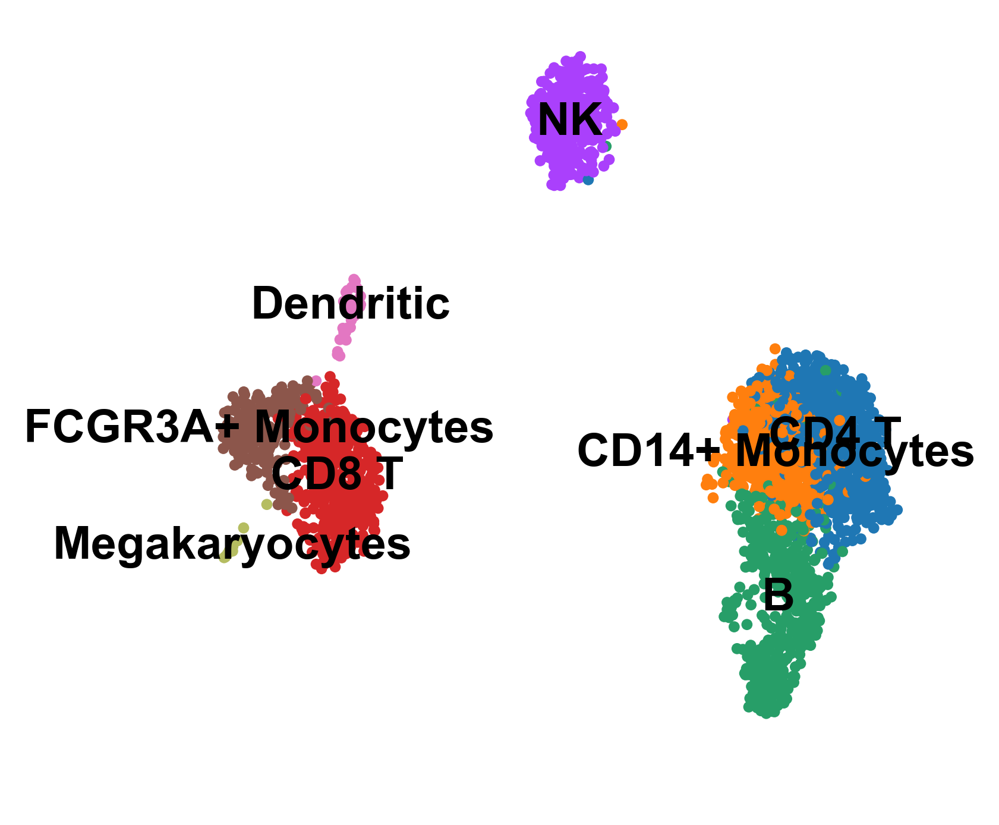

In [130]:
sc.pl.umap(adata, color='louvain', legend_loc='on data', title='', frameon=False, save='.pdf')

#### Now that we annotated the cell types, let us visualize the marker genes.

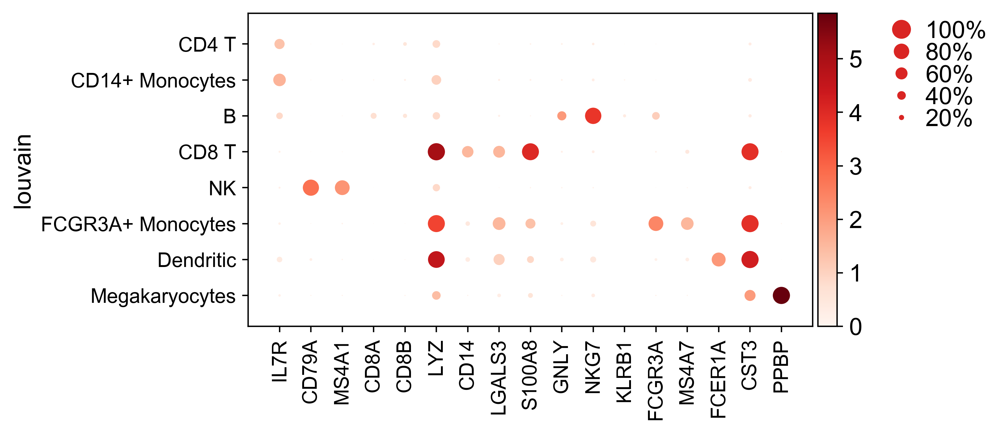

In [132]:
ax = sc.pl.dotplot(adata, marker_genes, groupby='louvain')

#### There is also a very compact violin plot.

/home/ivory/anaconda3/lib/python3.7/site-packages/numpy/lib/type_check.py:546: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  'a.item() instead', DeprecationWarning, stacklevel=1)


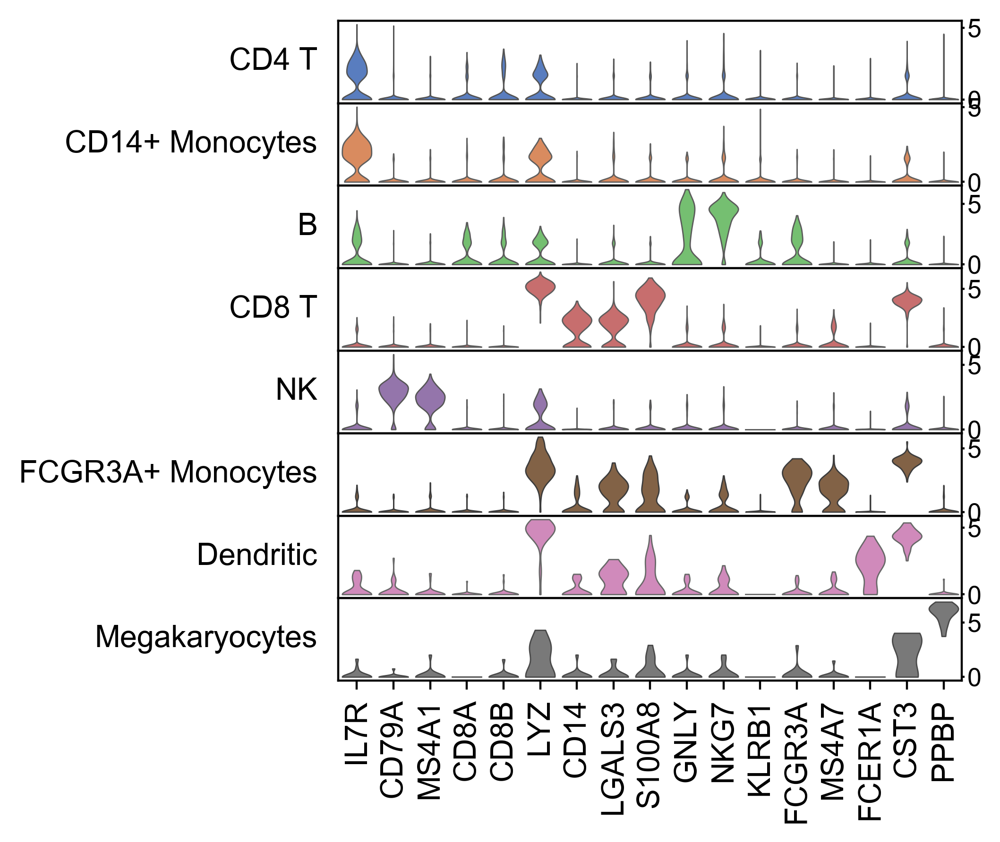

In [133]:
ax = sc.pl.stacked_violin(adata, marker_genes, groupby='louvain', rotation=90)

### During the course of this analysis, the AnnData accumlated the following annotations.

In [134]:
adata

AnnData object with n_obs × n_vars = 2638 × 1838 
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [135]:
adata.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading


#### If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations.

In [ ]:
adata.X = None
adata.write('./write/pbmc3k_withoutX.h5ad', compression='gzip')